<h1 align="center">NEURAL NETWORKS AND MACHINE LEARNING</h1>
<h1 align="center">ASSIGNMENT - 2</h1>

### Group Members:
> **AMISHA TRIPATHY      ROLL NO. - 1804426**

> **MOHIT KESHWANI      ROLL NO. - 1804450**

> **RIYA PATEL          ROLL NO. - 1804464**

> **TWISHA MUKHERJEE  ROLL NO. - 1804558**


### *Objective:*
  - **PREDICTION OF DIABETES USING SVM AND MLP ALGORITHM.**
  
### *Problem Statement:*
 - India is the diabetes capital of the world with as many as 50 million people suffering from diabetes, which causes increase in blood sugar.It is considered as one of the deadliest and chronic diseases and many complications can occur if diabetes remains untreated and unidentified. However, medical experts feel that timely detection and right management can go a long way in helping patients lead a normal life. 
 - Therefore, the rise in machine learning approaches can effectively solve this critical problem. The motive of this project is to design a model which can prognosticate the likelihood of diabetes in patients with maximum accuracy. Perhaps, two Machine learning classification algorithms namely __Support Vector Machine(SVM)__ and __Multi Linear Perceptron(MLP)__ are used to detect diabetes at an early stage.
 
### *Technology And Libraries Used:* 
  - Machine Learning
  - Scikit-Learn
  - Python
  - Numpy
  - Pandas
  - Matplotlib
  - Seaborn
  
### *PROJECT WORKFLOW:*
- [Data Acquisition](#task_1)
- [Data Exploration](#task_2)
- [Missing Values](#task_3)
   - [Replace all 0s using Simple Imputer](#task_3)
- [Visualization](#task_4)
- [Splitting The Dataset into train and test](#task_5)
- [Data Normalization](#task_6)
- [Feature Selection](#task_7)
- [Check Class Imbalance](#task_8)
   - [SMOTE](#task_9)
- [Model Building](#task_10)
   - [Model Hyperparameter Optimization](#task_11)
   - [Model Selection](#task_12)
- [Final Result](#task_13)

### *DATASET INFORMATION :*
- The Pima Indian Diabetes Dataset consists of information on 768 patients (268 tested positive and 500 tested negative). Tested positive and tested negative indicates whether the patient is diabetic or not. The datasets consist of several medical predictor (independent) variables and one target (dependent) variable, Outcome. Independent variables include the number of pregnancies the patient has had, their Glucose, Blood Pressure, Skin Thickness, Insulin, BMI,	Diabetes Pedigree Function and Age. In particular, all patients here are females at least 21 years old of Pima Indian heritage.

The Dataset has been taken from kaggle : https://www.kaggle.com/uciml/pima-indians-diabetes-database

## Data Acquisition<a id='task_1'></a>

### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv('diabetes_.csv')
data.shape

(768, 9)

In [3]:
data.Outcome.value_counts()

0    500
1    268
Name: Outcome, dtype: int64

In [4]:
data = pd.read_csv('diabetes.csv')
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


### Data Exploration<a id='task_2'></a>

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [7]:
import pandas_profiling
data.profile_report(title="Diabetes Data")

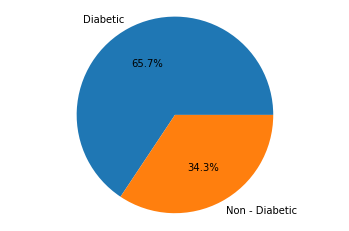

Percentage of people having Diabetes 65%
Percentage of people dosen't having Diabetes 34%


In [8]:
label = ['Diabetic' , 'Non - Diabetic' ]
sizes = [int(len(data[data.Outcome == 0])/len(data) * 100) , int(len(data[data.Outcome == 1])/len(data) * 100)]

plt.pie(sizes, labels=label , autopct = "%.1f%%")
plt.axis('equal')
plt.show()
print("Percentage of people having Diabetes {}%".format(int(len(data[data.Outcome == 0])/len(data) * 100)))
print("Percentage of people dosen't having Diabetes {}%".format(int(len(data[data.Outcome == 1])/len(data) * 100)))

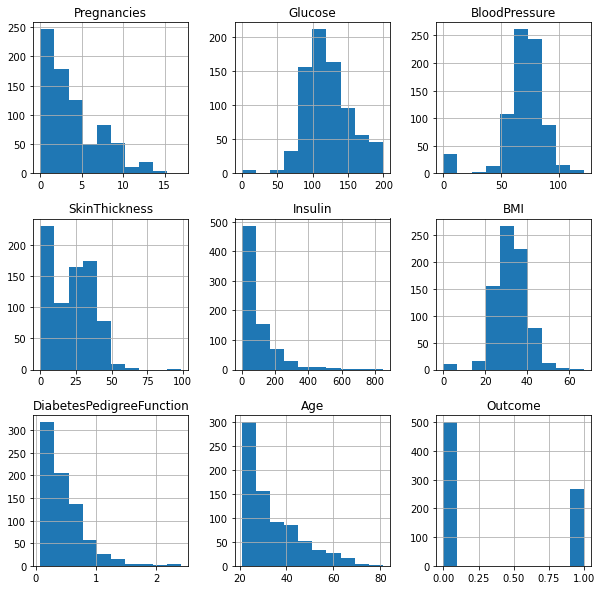

In [9]:
data.hist(figsize = (10,10))
plt.show()

In [10]:
data.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

### Missing Values<a id='task_3'></a>

In [11]:
print("total number of rows : {0}".format(len(data)))
print("number of rows missing glucose: {0}".format(len(data.loc[data['Glucose'] == 0])))
print("number of rows missing blood pressure: {0}".format(len(data.loc[data['BloodPressure'] == 0])))
print("number of rows missing skin: {0}".format(len(data.loc[data['SkinThickness'] == 0])))
print("number of rows missing bmi: {0}".format(len(data.loc[data['BMI'] == 0])))
print("number of rows missing insulin: {0}".format(len(data.loc[data['Insulin'] == 0])))
print("number of rows missing age: {0}".format(len(data.loc[data['Age'] == 0])))

total number of rows : 768
number of rows missing glucose: 5
number of rows missing blood pressure: 35
number of rows missing skin: 227
number of rows missing bmi: 11
number of rows missing insulin: 374
number of rows missing age: 0


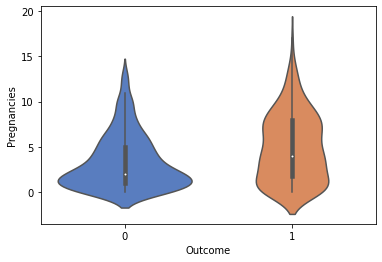

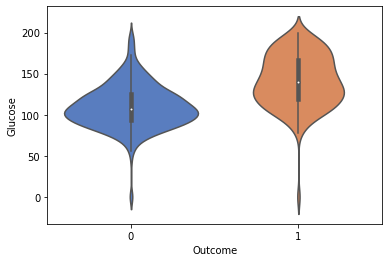

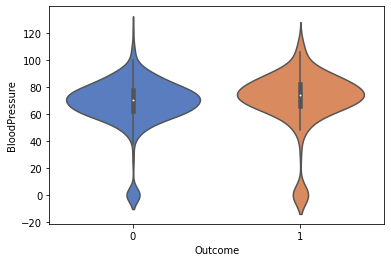

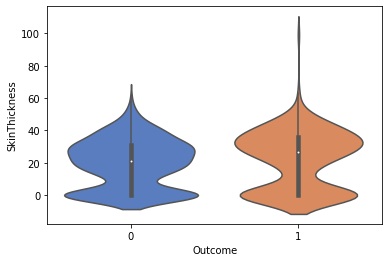

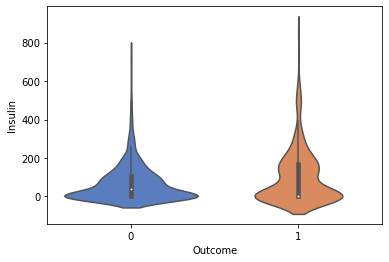

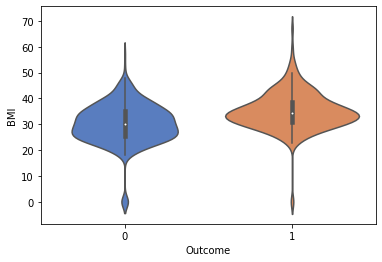

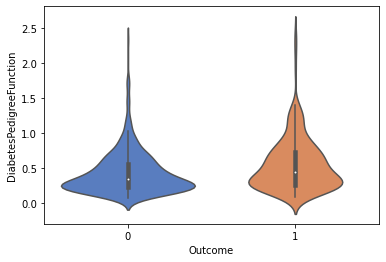

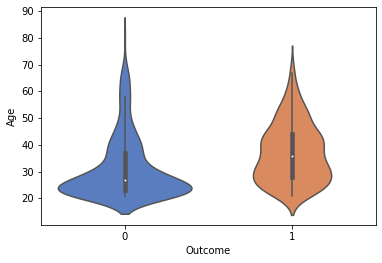

In [12]:
for col in data.columns[:8]:
    ax = sns.violinplot(x="Outcome", y=col , data=data, palette="muted", split=True)
    plt.show()

### Fill Missing Values 

In [13]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from numpy import mean, std
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold

X = data.drop(['Outcome'], axis=1)
y = data.Outcome
results = list()
strategies = ['mean', 'median', 'most_frequent', 'constant']
for s in strategies:
    pipeline = Pipeline(steps=[('i', SimpleImputer(missing_values = 0, strategy=s)), ('m', RandomForestClassifier())])
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(pipeline, X, y, scoring='accuracy', cv=3, n_jobs=-1)
    results.append(scores)
    print('%s %.3f (%.3f)' % (s, mean(scores), std(scores)))

mean 0.764 (0.026)
median 0.762 (0.018)
most_frequent 0.753 (0.019)
constant 0.768 (0.020)


In [14]:
from sklearn.impute import SimpleImputer

cols = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
fill_values = SimpleImputer(missing_values=0, strategy="mean")

data[cols] = fill_values.fit_transform(data[cols])

In [15]:
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.00000,155.548223,33.6,0.627,50,1
1,1,85.0,66.0,29.00000,155.548223,26.6,0.351,31,0
2,8,183.0,64.0,29.15342,155.548223,23.3,0.672,32,1
3,1,89.0,66.0,23.00000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.00000,168.000000,43.1,2.288,33,1


### Visualization<a id='task_4'></a>

<AxesSubplot:>

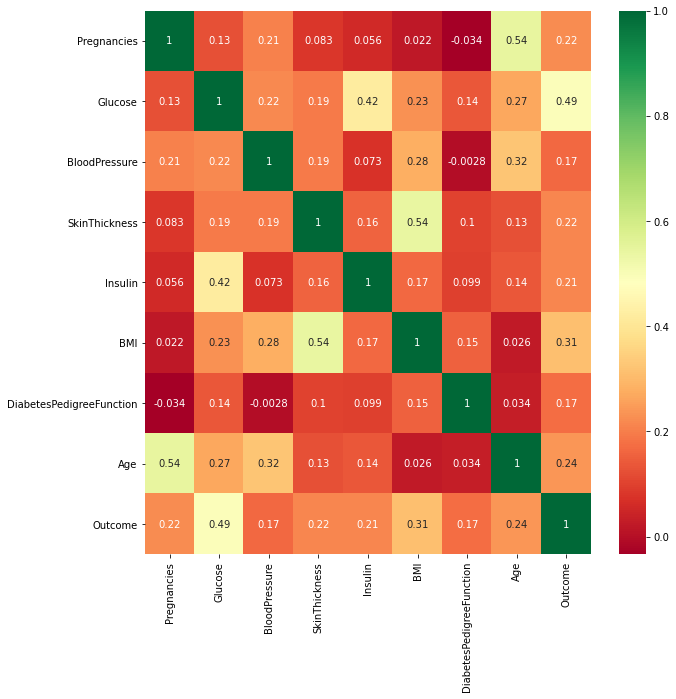

In [16]:
plt.figure(figsize = (10,10))
sns.heatmap(data.corr() , annot = True , cmap="RdYlGn")

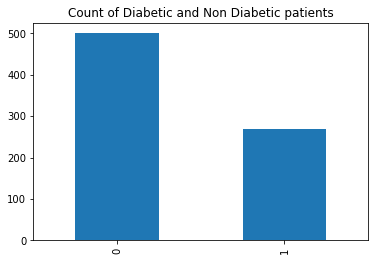

In [17]:
data.Outcome.value_counts().plot(kind = 'bar')
plt.title('Count of Diabetic and Non Diabetic patients')
plt.show()


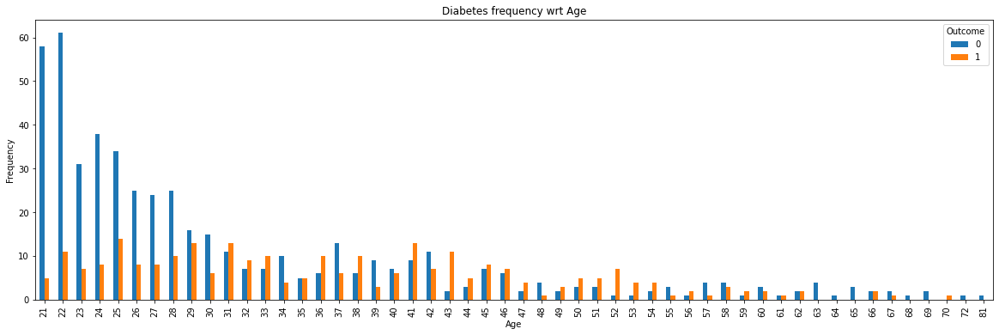

In [18]:
pd.crosstab(data.Age, data.Outcome).plot(kind = 'bar',figsize=(20,6))
plt.title('Diabetes frequency wrt Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

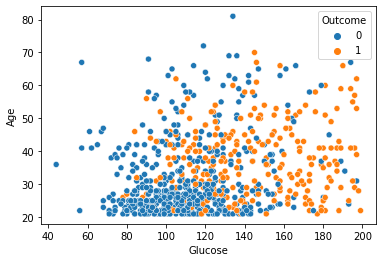

In [19]:
fig = sns.scatterplot(data.Glucose, data.Age , hue = data.Outcome)

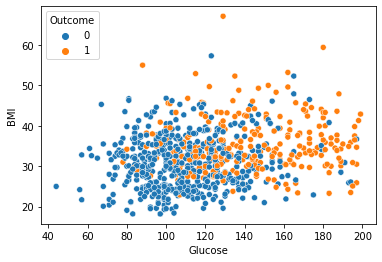

In [20]:
fig = sns.scatterplot(data.Glucose, data.BMI, hue = data.Outcome)

<AxesSubplot:>

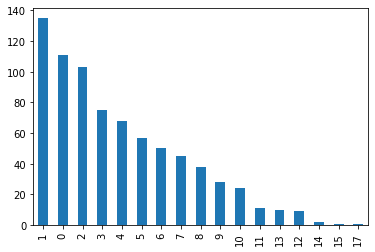

In [21]:
data.Pregnancies.value_counts().plot(kind = 'bar')

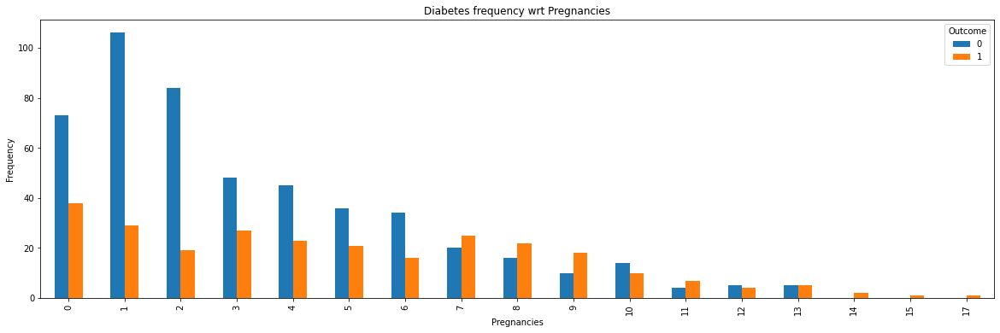

In [22]:
pd.crosstab(data.Pregnancies, data.Outcome).plot(kind = 'bar',figsize=(20,6))
plt.title('Diabetes frequency wrt Pregnancies')
plt.xlabel('Pregnancies')
plt.ylabel('Frequency')
plt.show()

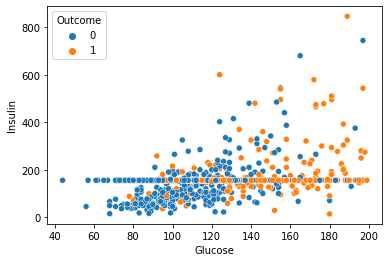

In [23]:
fig = sns.scatterplot(data.Glucose, data.Insulin, hue = data.Outcome)

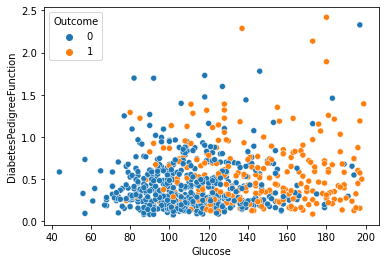

In [24]:
fig = sns.scatterplot(data.Glucose, data.DiabetesPedigreeFunction, hue = data.Outcome)

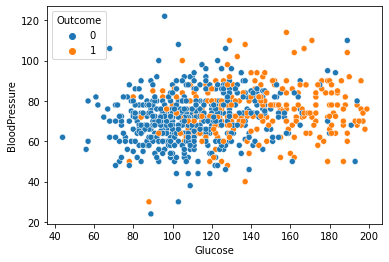

In [25]:
fig = sns.scatterplot(data.Glucose, data.BloodPressure, hue = data.Outcome)

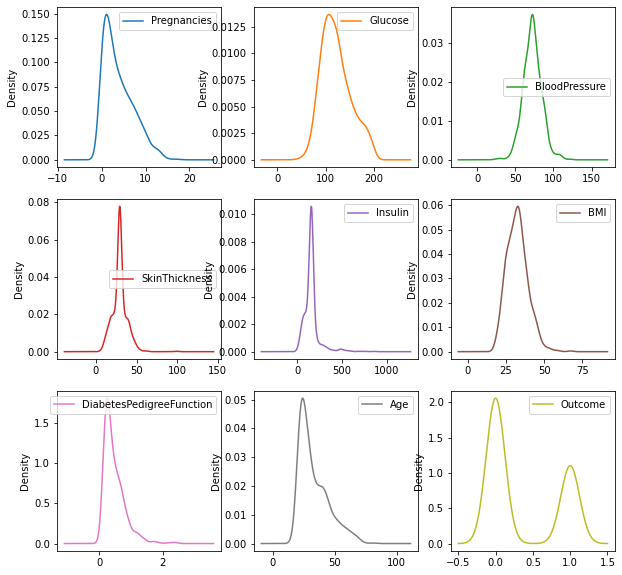

In [26]:
data.plot(kind='density', subplots=True, layout=(3,3), sharex=False , figsize =(10,10))
plt.show()

### Splitting the dataset into train and test<a id='task_5'></a>

In [27]:
from sklearn.model_selection import train_test_split, cross_val_score

X_train, X_test, y_train, y_test = train_test_split(data.drop(['Outcome'], axis = 1), 
                                                   data.Outcome, 
                                                   test_size = 0.25,
                                                   random_state = 20)

print("Training set has {} samples.".format(X_train.shape[0]))
print("Testing set has {} samples.".format(X_test.shape[0]))

Training set has 576 samples.
Testing set has 192 samples.


### Data Normalization<a id='task_6'></a>

In [28]:
#import MinMaxScaler from sklearn to normalize the numerical features
from sklearn.preprocessing import MinMaxScaler


#initializing the scaler function 
scaler = MinMaxScaler()
scaler.fit(X_train[:])
#fitting and transposing all the numerical features
X_train[:] = scaler.transform(X_train[:])
X_test[:] = scaler.transform(X_test[:])

### Feature Selection<a id='task_7'></a>

In [30]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.feature_selection import mutual_info_classif

mutual_info = mutual_info_classif(X_train, y_train)
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending = False)
    

Glucose                     0.135081
BMI                         0.082652
Insulin                     0.066985
Age                         0.066448
Pregnancies                 0.041142
DiabetesPedigreeFunction    0.020560
BloodPressure               0.018419
SkinThickness               0.005325
dtype: float64

In [31]:
X_train.drop(['SkinThickness'], axis=1, inplace=True)
X_test.drop(['SkinThickness'], axis=1, inplace=True)

### Check Class Imbalance<a id='task_8'></a>

<AxesSubplot:>

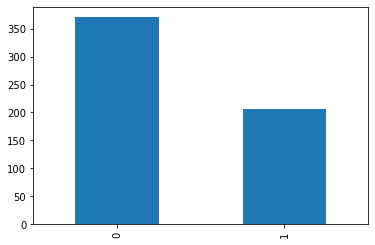

In [32]:
y_train.value_counts().plot(kind='bar')

### SMOTE<a id='task_9'></a>

In [33]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
X_train, y_train = sm.fit_sample(X_train, y_train)
X_train.shape, y_train.shape

((740, 7), (740,))

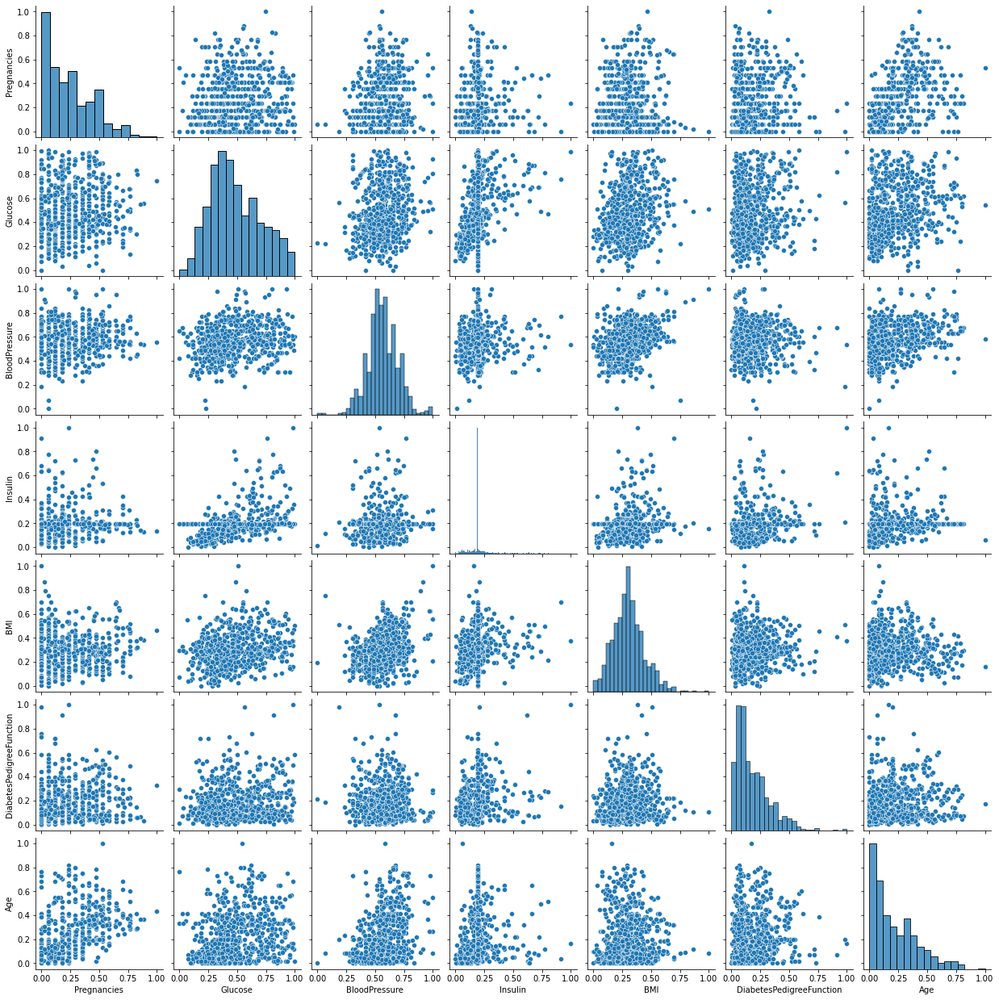

In [34]:
sns.pairplot(X_train)

### Model Building<a id='task_10'></a>

In [35]:
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import fbeta_score , accuracy_score, roc_curve, auc
from sklearn.model_selection import GridSearchCV, KFold

In [36]:
from sklearn.metrics import fbeta_score , accuracy_score
def train_predict(learner, sample_size, X_train, y_train, X_test, y_test): 
    results = {}
    
    start = time() 
    learner = learner.fit(X_train[:sample_size] , y_train[:sample_size])
    end = time()
    results['train_time'] = end - start
    
    start = time()
    predictions_test = learner.predict(X_test)
    predictions_train = learner.predict(X_train[:300])
    end = time() 
    results['pred_time'] = end - start
    
    results['acc_train'] = accuracy_score(y_train[:300] , predictions_train)
    results['acc_test'] = accuracy_score(y_test , predictions_test)
    results['f_train'] = fbeta_score(y_train[:300] , predictions_train , 1)
    results['f_test'] = fbeta_score(y_test , predictions_test , 0.5)
    
    print("{} trained on {} samples.".format(learner.__class__.__name__, sample_size))
    return results

**Model Building with default parameters**

In [37]:
clf1 = SVC()
clf2 = MLPClassifier()

samples_100 = len(X_train)

results = {}
for clf in [clf1, clf2]:
    clf_name = clf.__class__.__name__
    results[clf_name] = {}
    results[clf_name] = train_predict(clf, samples_100, X_train, y_train, X_test, y_test)

SVC trained on 740 samples.
MLPClassifier trained on 740 samples.


In [38]:
display(pd.DataFrame(results))

,SVC,MLPClassifier
train_time,0.040790,1.483877
pred_time,0.048795,0.006472
acc_train,0.803333,0.783333
acc_test,0.760417,0.744792
f_train,0.755187,0.732510
f_test,0.628492,0.608808


**Both models are approximately performing equally**

### Model Hyperparameter Optimization<a id='task_11'></a>
 - Now lets optimize both the models and calculate performane matrix to check which model is the best

In [39]:
#Initializing the model
clf = SVC()
#parameters that we are going to optimize 
parameters = { 'C': [0.1, 0.5, 1, 10, 50, 100],
              'gamma': [0.001, 0.01, 0.05, 0.1, 0.5, 1, 10],
              'kernel': ['rbf']
             }
#creating the optimizer object
grid_obj_SVC = GridSearchCV(clf , parameters, n_jobs=-1)

#fitting the obj to out dataset
grid_fit_SVC = grid_obj_SVC.fit(X_train,y_train)
#finding the best parameters 
best_clf1 = grid_fit_SVC.best_estimator_

#predictions on unoptimized model
predictions = (clf.fit(X_train, y_train)).predict(X_test)

#predictions on optimized model 
best_predictions = best_clf1.predict(X_test)

print("Unoptimized model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("F-score on testing data: {:.4f}".format(fbeta_score(y_test, predictions, beta = 0.5)))
print("\nOptimized Model\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5)))
print("Final Hyperparameters: %s" %grid_fit_SVC.best_params_)


Unoptimized model
------
Accuracy score on testing data: 0.7604
F-score on testing data: 0.6285

Optimized Model
------
Final accuracy score on the testing data: 0.7396
Final F-score on the testing data: 0.5994
Final Hyperparameters: {'C': 1, 'gamma': 10, 'kernel': 'rbf'}


**Confusion Matrix and AUC score**

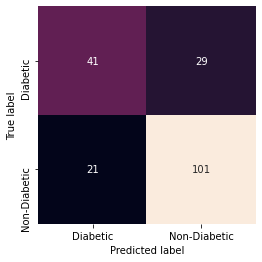

In [40]:
matrix=confusion_matrix( y_test, best_predictions,labels=[1,0])
sns.heatmap(matrix.T,square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Diabetic', 'Non-Diabetic'],
            yticklabels=['Diabetic','Non-Diabetic'])
plt.xlabel('Predicted label')
plt.ylabel('True label');

In [41]:
y_test.value_counts()

0    130
1     62
Name: Outcome, dtype: int64

In [42]:
fpr, tpr, treshold = roc_curve(y_test, best_predictions)
roc_auc = auc(fpr, tpr)

roc_auc

0.719106699751861

In [43]:
#Initializing the model
clf = MLPClassifier(max_iter = 100)

#parameters that we are going to optimize 
parameters = { 'hidden_layer_sizes': [(50,),(100,),(120,), (150,)],
              'activation': ['tanh', 'relu'],
              'solver': ['adam', 'sgd'],
              'alpha': [0.0001, 0.005, 0.1],
              'learning_rate': ['constant', 'adaptive']
             }

#creating the optimizer object
grid_obj_MLP = GridSearchCV(clf , parameters, n_jobs=-1)

#fitting the obj to out dataset
grid_fit_MLP = grid_obj_MLP.fit(X_train,y_train)

#finding the best parameters 
best_clf2 = grid_fit_MLP.best_estimator_

#predictions on unoptimized model
predictions = (clf.fit(X_train, y_train)).predict(X_test)

#predictions on optimized model 
best_predictions = best_clf2.predict(X_test)

print("Unoptimized model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("F-score on testing data: {:.4f}".format(fbeta_score(y_test, predictions, beta = 0.5)))
print("\nOptimized Model\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5)))
print("Final Hyperparameters: %s" %grid_fit_MLP.best_params_)

Unoptimized model
------
Accuracy score on testing data: 0.7708
F-score on testing data: 0.6417

Optimized Model
------
Final accuracy score on the testing data: 0.7656
Final F-score on the testing data: 0.6351
Final Hyperparameters: {'activation': 'relu', 'alpha': 0.1, 'hidden_layer_sizes': (120,), 'learning_rate': 'constant', 'solver': 'adam'}


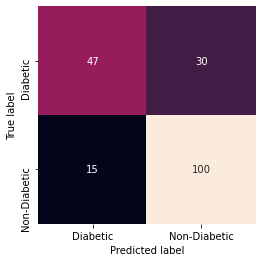

In [47]:
matrix=confusion_matrix(y_test, best_predictions,labels=[1,0])
sns.heatmap(matrix.T,square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Diabetic', 'Non-Diabetic'],
            yticklabels=['Diabetic','Non-Diabetic'])
plt.xlabel('Predicted label')
plt.ylabel('True label');

In [48]:
y_test.value_counts()

0    130
1     62
Name: Outcome, dtype: int64

In [49]:
fpr, tpr, treshold = roc_curve(y_test, best_predictions)
roc_auc = auc(fpr, tpr)
roc_auc

0.7636476426799006